In [81]:
import nltk
import pandas as pd 
from nltk.corpus import wordnet
from nltk.corpus import stopwords 

In [82]:
import json
df = pd.read_csv('booksummaries.txt', sep='\t',
                 names=['id1', 'id2', 'title', 'author', 'year', 'genres', 'summary'],
                 usecols=[2, 3, 5, 6], converters={'genres' : lambda s : (list(json.loads(s).values()) if s else None)})

In [83]:
from nltk import RegexpTokenizer

def tokenize_summary(df, summary):
    # Removing punctuation
    tokenizer = RegexpTokenizer(r"\w+")
    stop_words = set(stopwords.words("english"))  # Use a set for faster lookup
    
    # Tokenize and preprocess text
    tokens = df[summary].map(lambda x: tokenizer.tokenize(x.lower()))  # Convert to lowercase before tokenization
    tokens = tokens.map(lambda x: [i.strip("_") for i in x])  # Remove leading/trailing underscores
    tokens = tokens.map(lambda x: [i for i in x if i not in stop_words])  # Remove stop words
    tokens = tokens.map(lambda x: [i for i in x if i != ""])  # Remove empty tokens
    
    return tokens

In [84]:
df["Tokenized_Summary"] = tokenize_summary(df, "summary")

In [85]:
from collections import Counter
# Iterate through each row to extract and split the list of genres
all_genres = []
all_genres = []
genres_column = df['genres']
# Iterate through each element in the 'genres_column'
for genres_item in genres_column:
    # Check if the element is a string
    if isinstance(genres_item, str):
        # Split the string by comma and extend the list of all genres
        all_genres.extend([genre.strip() for genre in genres_item.split(',')])
    # Check if the element is a list
    elif isinstance(genres_item, list):
        # Extend the list of all genres directly
        all_genres.extend(genres_item)

# Count the occurrences of each unique genre
genre_counts = Counter(all_genres)

In [86]:
# Iterate through each row to extract and split the list of genres
book_list = []
# Iterate through each element in the 'genres_column'
valid_genres = [#'Speculative fiction',
                'Science Fiction','Crime Fiction','Non-fiction','Children\'s literature',
                'Fantasy', 'Mystery', 'Suspense', 'Young adult literature']
for i, row in df.iterrows():
    if row["genres"]:
        for genre in valid_genres:
            new_row={
                "title": row["title"],
                "author": row["author"],
                "summary": row["summary"]
                }
            genre_list=row["genres"]
            if genre in genre_list:
                new_row["genre"]=genre
                book_list.append(new_row)
book_df = pd.DataFrame(book_list)
book_df
#     # Check if the element is a string
#     if isinstance(genres_item, str):
#         # Split the string by comma and extend the list of all genres
#         all_genres.extend([genre.strip() for genre in genres_item.split(',')])
#     # Check if the element is a list
#     elif isinstance(genres_item, list):
#         # Extend the list of all genres directly
#         all_genres.extend(genres_item)

,title,author,summary,genre
0,Animal Farm,George Orwell,"Old Major, the old boar on the Manor Farm, ca...",Children's literature
1,A Clockwork Orange,Anthony Burgess,"Alex, a teenager living in near-future Englan...",Science Fiction
2,A Fire Upon the Deep,Vernor Vinge,The novel posits that space around the Milky ...,Science Fiction
3,A Fire Upon the Deep,Vernor Vinge,The novel posits that space around the Milky ...,Fantasy
4,A Wizard of Earthsea,Ursula K. Le Guin,"Ged is a young boy on Gont, one of the larger...",Children's literature
...,...,...,...,...
11369,Heaven,V. C. Andrews,Heaven Leigh Casteel is a fourteen year old g...,Young adult literature
11370,Dark Angel,V. C. Andrews,After the events of Heaven (the first book in...,Young adult literature
11371,Gates of Paradise,V. C. Andrews,"A novel about Annie Stonewall, the daughter o...",Young adult literature
11372,The Third Lynx,Timothy Zahn,The story starts with former government agent...,Science Fiction


In [87]:
book_df.dropna(inplace=True)
book_df["Tokenized_Summary"] = tokenize_summary(book_df, "summary")
book_df.dropna(inplace=True)
book_df

,title,author,summary,genre,Tokenized_Summary
0,Animal Farm,George Orwell,"Old Major, the old boar on the Manor Farm, ca...",Children's literature,"[old, major, old, boar, manor, farm, calls, an..."
1,A Clockwork Orange,Anthony Burgess,"Alex, a teenager living in near-future Englan...",Science Fiction,"[alex, teenager, living, near, future, england..."
2,A Fire Upon the Deep,Vernor Vinge,The novel posits that space around the Milky ...,Science Fiction,"[novel, posits, space, around, milky, way, div..."
3,A Fire Upon the Deep,Vernor Vinge,The novel posits that space around the Milky ...,Fantasy,"[novel, posits, space, around, milky, way, div..."
4,A Wizard of Earthsea,Ursula K. Le Guin,"Ged is a young boy on Gont, one of the larger...",Children's literature,"[ged, young, boy, gont, one, larger, islands, ..."
...,...,...,...,...,...
11369,Heaven,V. C. Andrews,Heaven Leigh Casteel is a fourteen year old g...,Young adult literature,"[heaven, leigh, casteel, fourteen, year, old, ..."
11370,Dark Angel,V. C. Andrews,After the events of Heaven (the first book in...,Young adult literature,"[events, heaven, first, book, casteel, series,..."
11371,Gates of Paradise,V. C. Andrews,"A novel about Annie Stonewall, the daughter o...",Young adult literature,"[novel, annie, stonewall, daughter, heaven, ca..."
11372,The Third Lynx,Timothy Zahn,The story starts with former government agent...,Science Fiction,"[story, starts, former, government, agent, fra..."


In [88]:
from wordcloud import WordCloud,STOPWORDS

In [89]:
from nltk.corpus import stopwords
STOPWORDS.update(["one"])
w = stopwords.words('english')
STOPWORDS.update(w)

In [90]:
from PIL import Image
def make_plot_words(genre):
    des = " ".join(plot for plot in book_df[book_df["genre"]==genre].Tokenized_Summary)
    wordcloud = WordCloud(width=1600, height=800,  mode="RGBA", background_color='white', max_words=1000).generate(des)
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(label=" Word Cloud for {}".format(genre), fontsize=40)
    plt.tight_layout(pad=0)
    plt.savefig("./{}.png".format(genre), format="png")
    plt.show()

In [91]:

valid_genres_list = ['Science Fiction', 'Fantasy', 'Mystery', 'Young adult literature', 'Suspense', 'Non-fiction', 'Crime Fiction' ]

# Convert the list to a dictionary where each genre name is a key and its index is the value
valid_genres_dict = {genre: i for i, genre in enumerate(valid_genres_list)}
# Concatenate the tokens into a single string
book_df['Tokenized_Summary'] = book_df['Tokenized_Summary'].apply(lambda x: ' '.join(x))

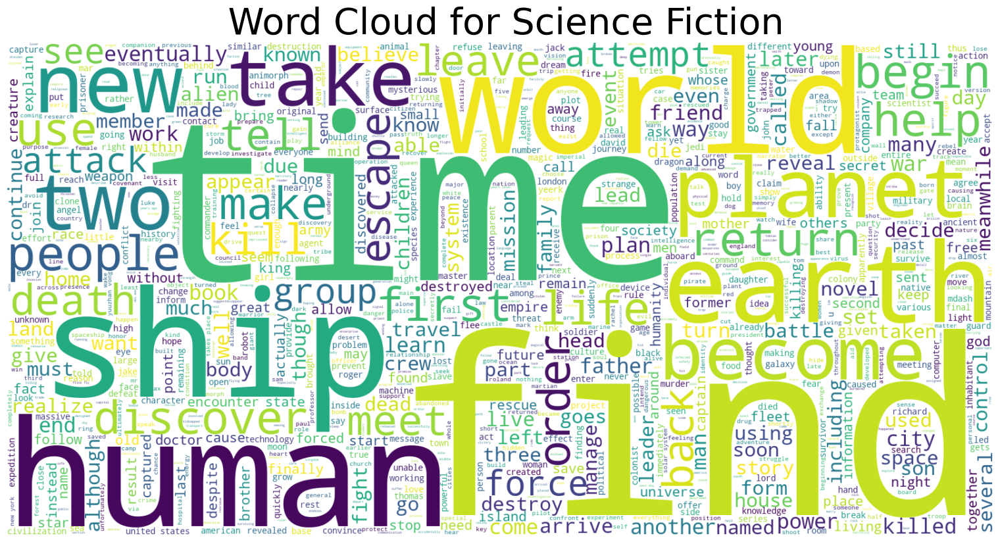

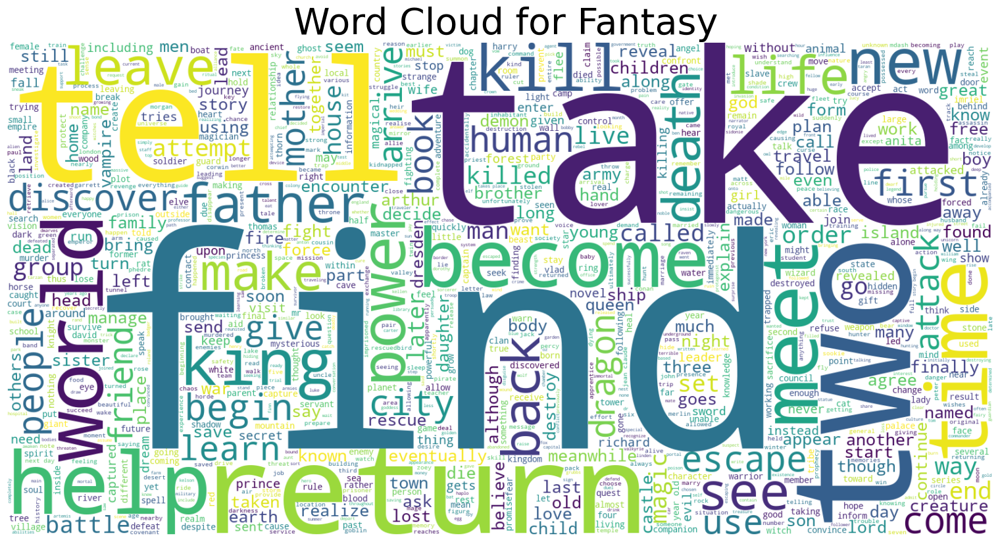

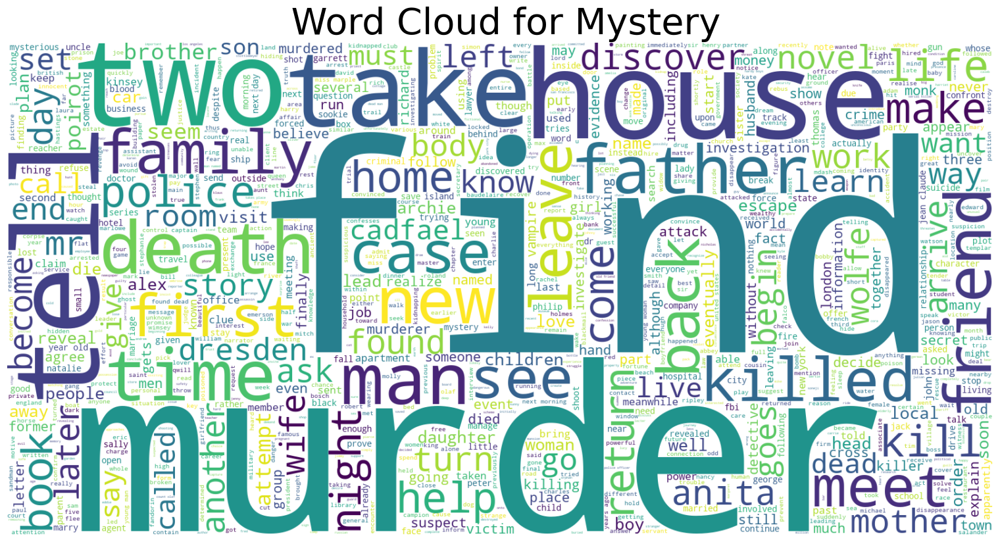

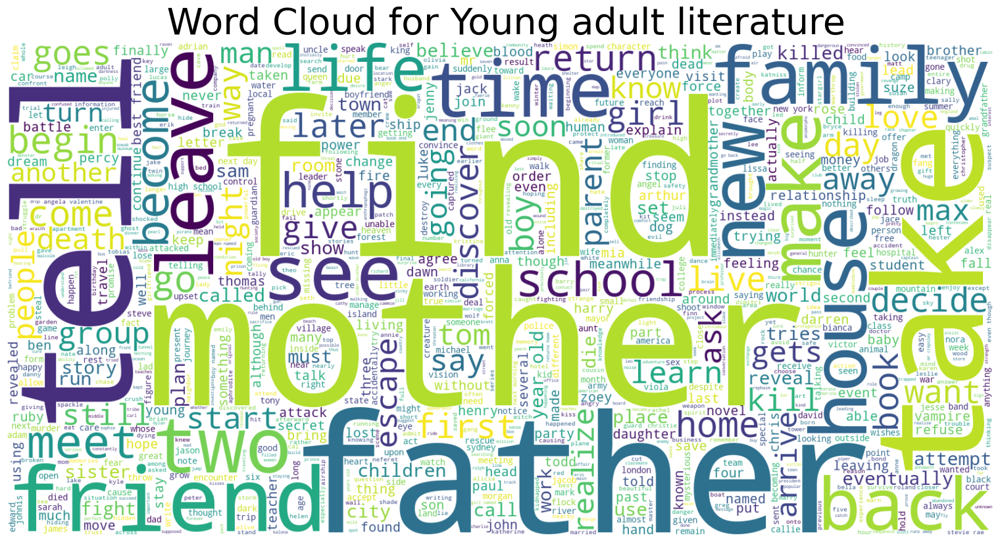

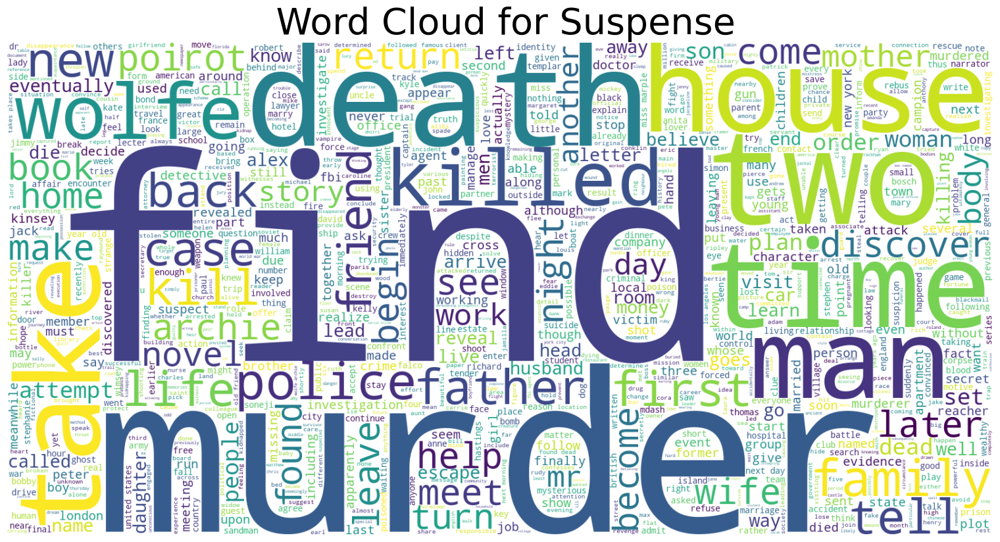

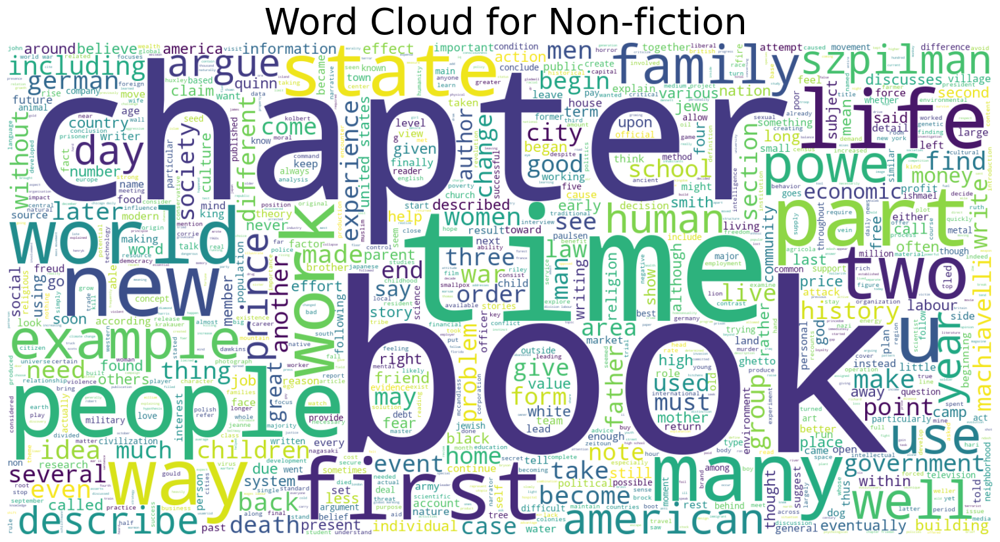

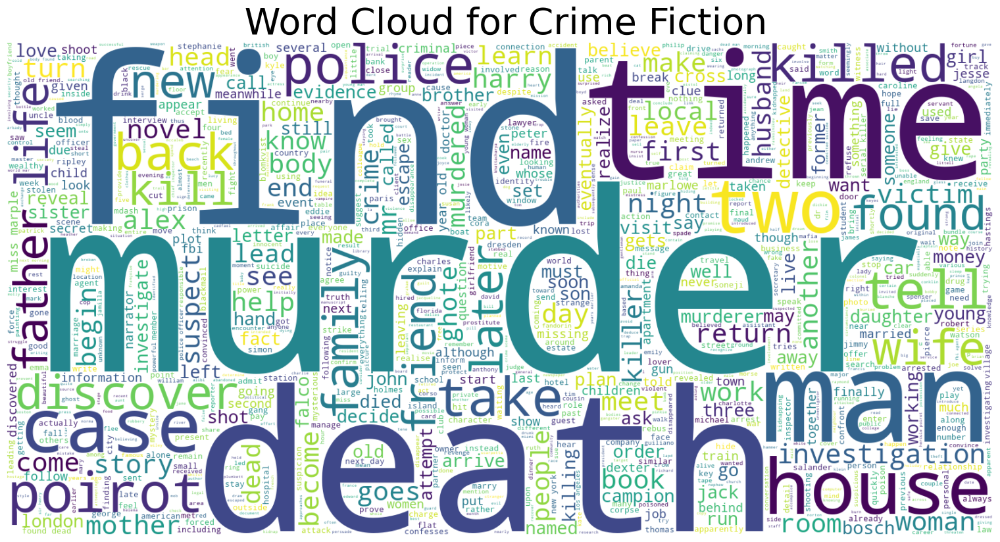

In [92]:
for i, g in enumerate(valid_genres_dict.keys()):
    make_plot_words(genre=g)